# Experiment 1 vs Experiment 2 - W-estimate skill comparison

Overlays the summary figures from **experiment_1** and **experiment_2**, which are
identical except that experiment_2 passes `extrapolate_to_surface=True` to
`compute_w_planefit` (so its integrated w reaches the surface; its depth grid runs
0 -> -70 m instead of -8 -> -70 m).

Reproduces Figures **2a-2d** (skill vs array width) and **5a-5d** (skill vs depth)
from `experiment_*/summary.ipynb`, plotting both experiments on the same axes.

Encoding used throughout:

- **color** = the within-method knob (cell center latitude / gliders-per-cell for
  2a-c / 5a-c; **cell shape** - diamond / hexagon / square - for 2d / 5d).
- **linestyle + marker fill** = experiment: **exp1 = solid, filled marker**;
  **exp2 = dashed, open marker**.
- **marker shape** (2d / 5d only) = cell height (o = 1deg tall, ^ = 2deg tall).

Everything is read from `experiment_*/data/`; figures are written to this folder.
Run in place after both experiments have populated their `data/`.

In [1]:
import os, sys
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt

REPO = "/home/edavenport/analysis/tpose24-osse"
sys.path.insert(0, REPO)
import summary_fig_tools as sft

OUTDIR = os.path.join(REPO, "experiments", "compare_exp_1_2"); os.makedirs(OUTDIR, exist_ok=True)
plt.rcParams["figure.dpi"] = 120
sft.apply_style()

EXP_ROOT = {1: os.path.join(REPO, "experiments", "experiment_1"), 2: os.path.join(REPO, "experiments", "experiment_2")}
M = {e: pd.read_csv(os.path.join(EXP_ROOT[e], "data", "metrics.csv")) for e in (1, 2)}

def load_cell(exp, row):
    """Open the saved w_est/w_model/bias arrays for one metrics row of an experiment."""
    return xr.open_dataset(os.path.join(EXP_ROOT[exp], row.nc_path))

print({e: len(M[e]) for e in (1, 2)})

{1: 169, 2: 169}


In [2]:
# Shared style / helpers now live in summary_fig_tools (imported as sft).

## Figures 2a-2d - skill vs array width, exp1 vs exp2

One figure per method. Panels 1-2: normalized error and correlation vs glider
offset, with exp1 (solid, filled) and exp2 (dashed, open) overlaid; color is the
within-method knob. Panel 4: the fixed platform layout (identical for both
experiments).

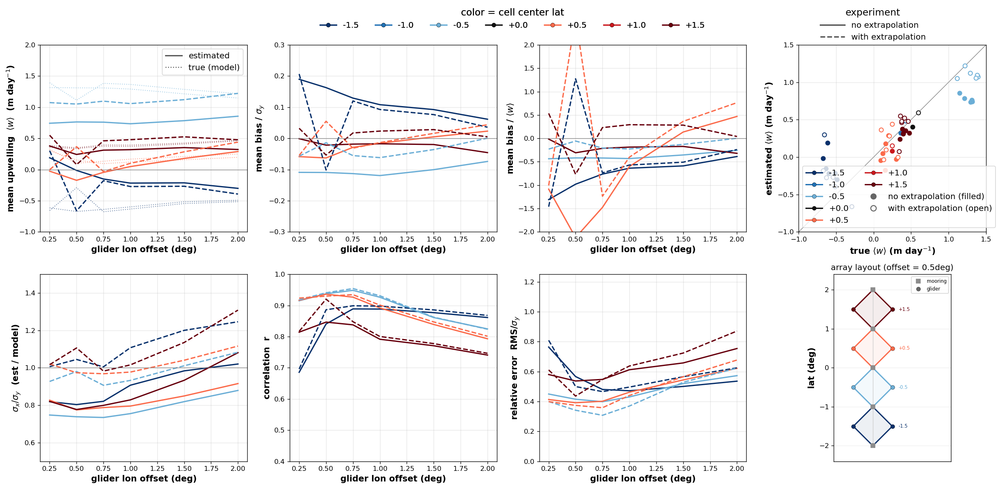

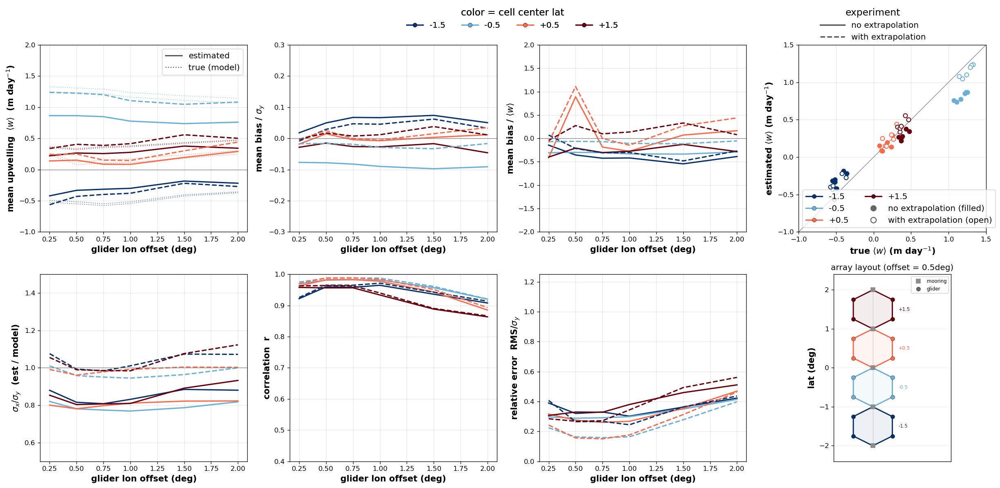

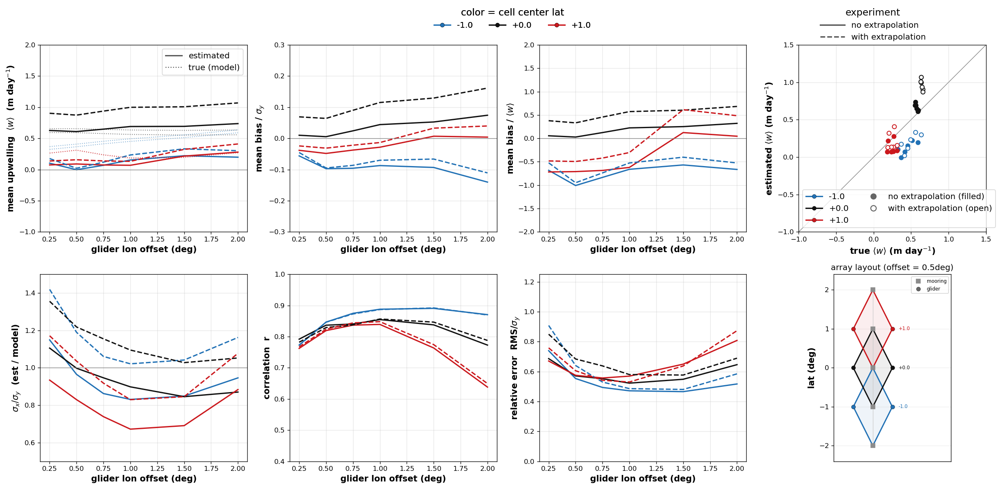

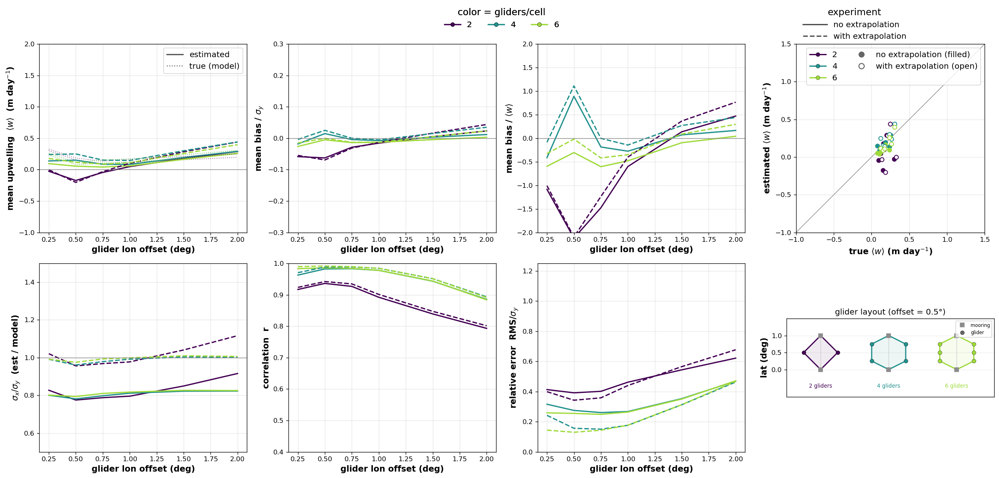

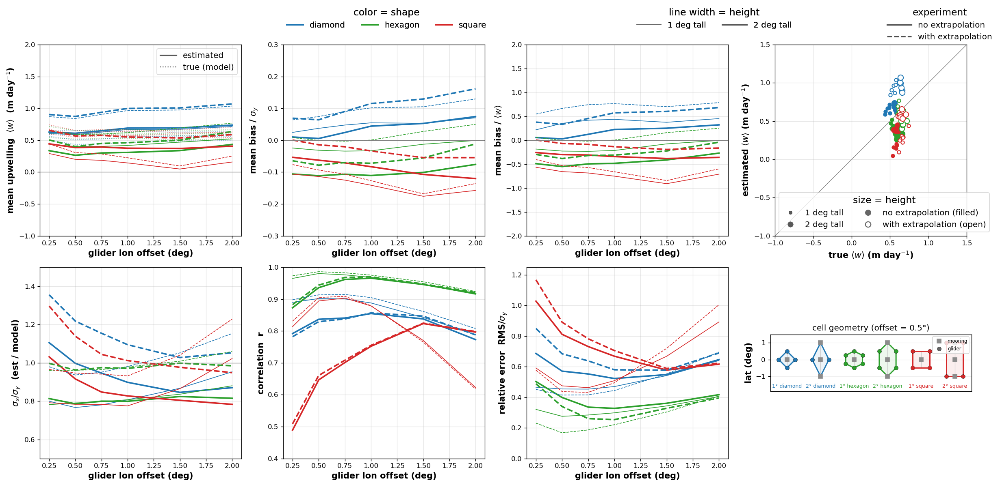

In [3]:
sft.make_fig2abcd_compare(M, OUTDIR)

In [4]:
# fig2d is drawn by make_fig2abcd_compare above.

## Figures 5a-5d - skill vs depth, exp1 vs exp2

Depth-resolved skill at a fixed glider offset (`DEPTH_WIDTH = 1.0deg` for 5a-5c,
`0.5deg` for 5d), one figure per method. Panels: normalized error, correlation,
fractional mean bias (⟨w_est⟩−⟨w_model⟩)/⟨w_model⟩ (masked at the mean's
zero-crossings), absolute RMS (colored) vs signal std (gray), and the mean w
profile itself — estimate (colored) vs model truth (gray). exp1 = solid/filled,
exp2 = dashed/open. Because exp2 extrapolates to the surface, its profiles extend
above -8 m up to 0 m.

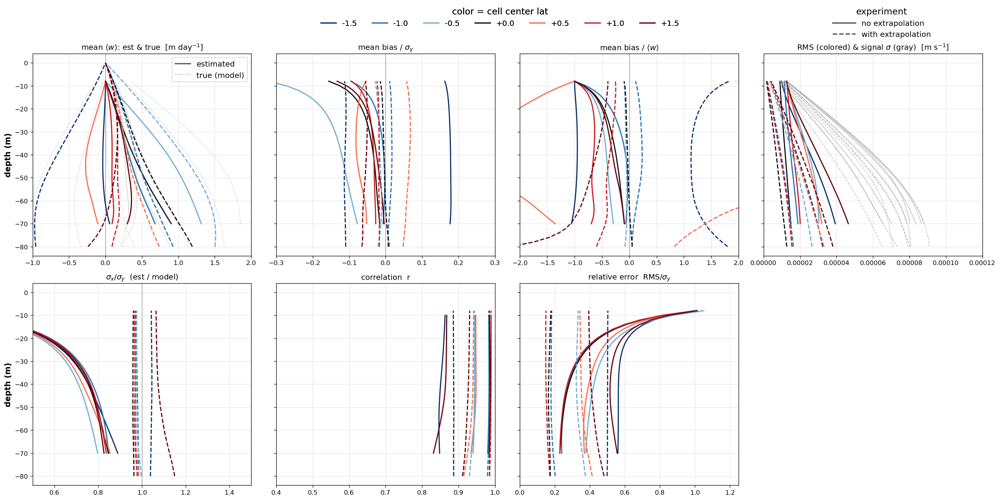

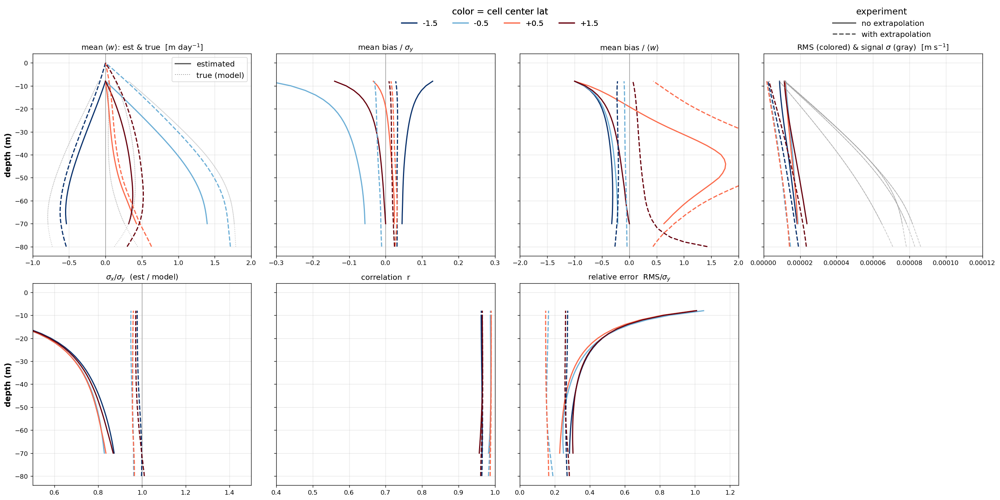

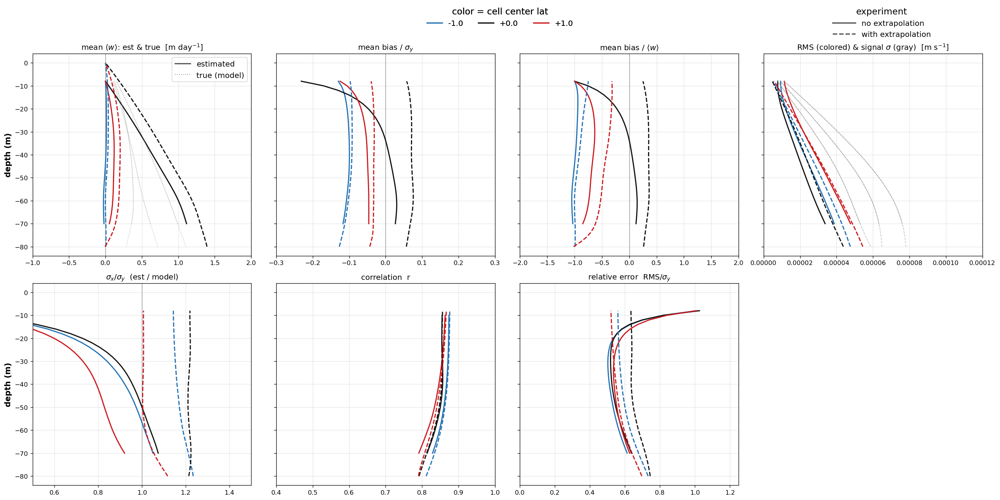

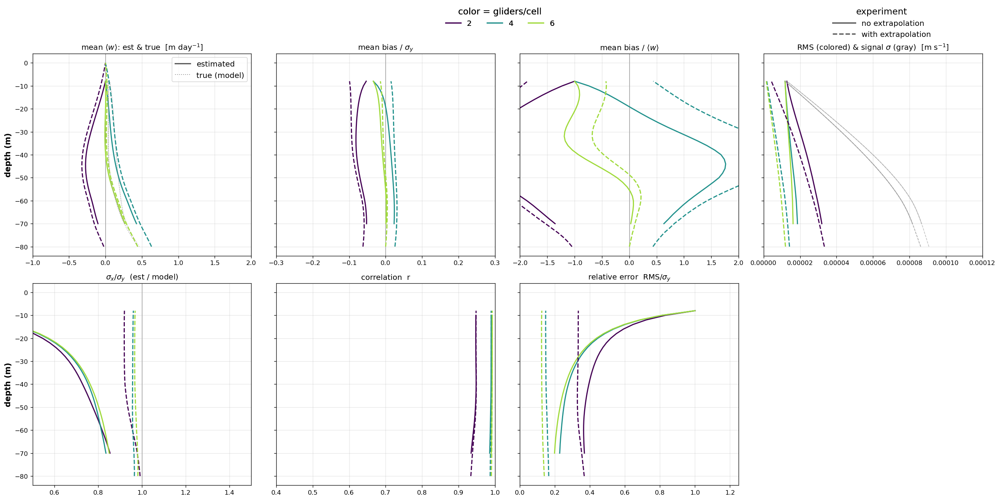

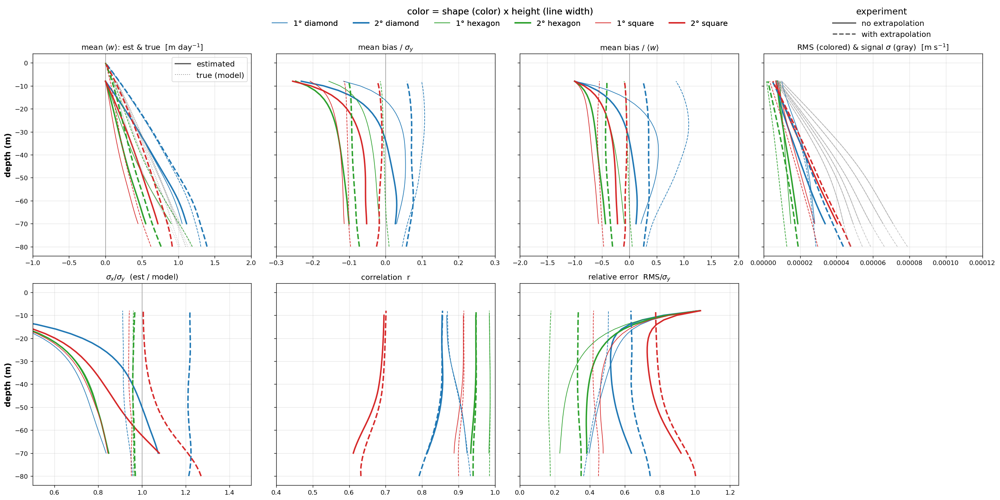

In [5]:
sft.make_fig5_compare(M, OUTDIR, load_cell)

## Figure 6 - metric-change heatmaps (exp2 - exp1 at a glance)

The fig6 "colored squares" from each experiment's summary.ipynb, differenced
so the effect of surface extrapolation is visible across every config in one
view. Rows = estimate cell (pattern @ center latitude), columns = glider lon
offset (array width). Each panel is oriented so **teal = exp2 better, brown =
exp2 worse**: RMS/sigma and |bias|/sigma use exp1 - exp2 (positive = exp2
smaller), correlation uses exp2 - exp1 (positive = exp2 higher). Descriptive
only - shows where the surface-extrapolation choice matters.

**Figures 6a-6d** repeat this change grid one method at a time (same split as fig2a-2d / fig5a-5d): 6a shift, 6b equator 3-cell, 6c density, 6d equator single-cell. Each sub-figure auto-scales its own color range.

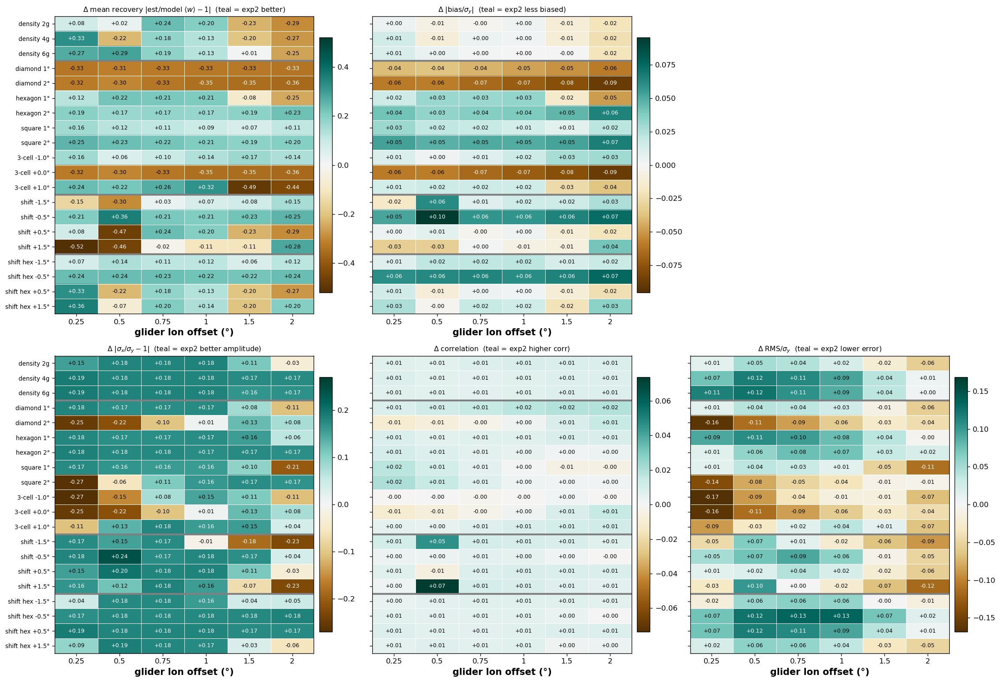

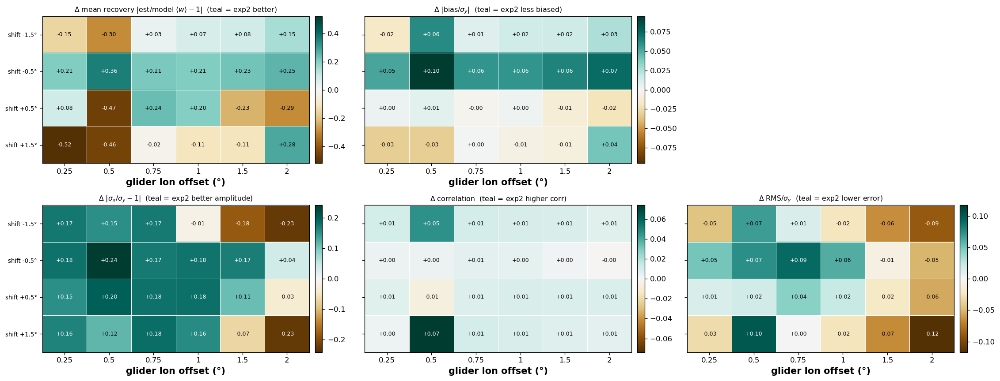

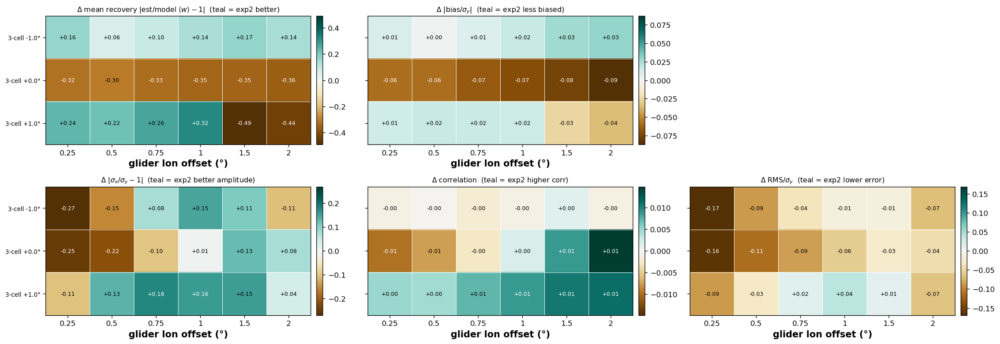

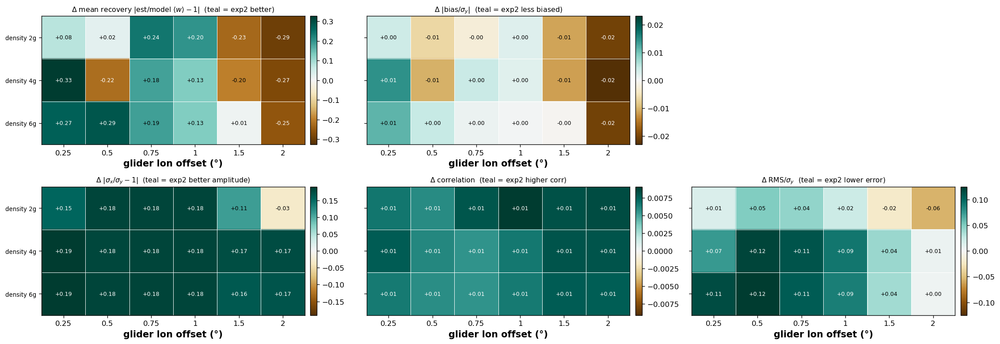

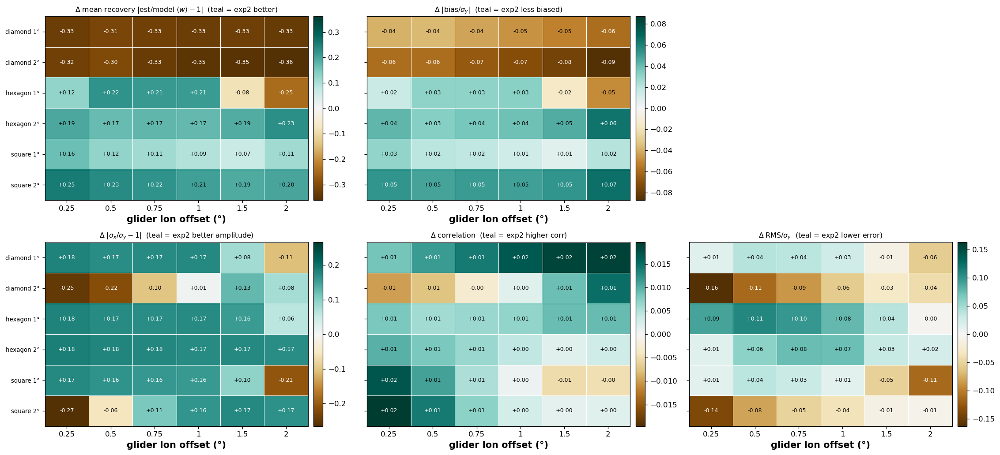

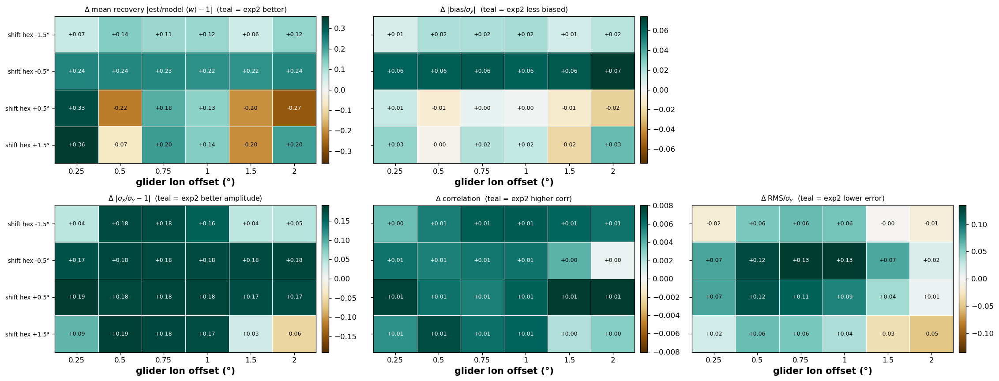

In [6]:
sft.make_fig6_compare(M, OUTDIR)

## Figures 7a-7e - time-mean \<w\> with confidence intervals, exp1 vs exp2

The estimated time-mean upwelling and how surface extrapolation changes it. Per
config: a depth profile of the estimated \<w\> for exp1 (solid) and exp2 (dashed),
each with a shaded +/-1.96*SE band, against the shared model truth (gray dotted);
plus a "total over depth" forest panel (true, exp1, exp2 +/- CI per config).

The SE is autocorrelation-aware (N_eff = N/tau, tau ~ 1 day, so ~30-70 effective
samples out of 648). The CI is about the expected / long-run mean, not the exact
window average. Overlapping exp1/exp2 bands mean the two estimates recover the
same time-mean within uncertainty; a band straddling zero means the record does
not resolve a nonzero mean. The tighter paired test is the `mean_bias_se` column.

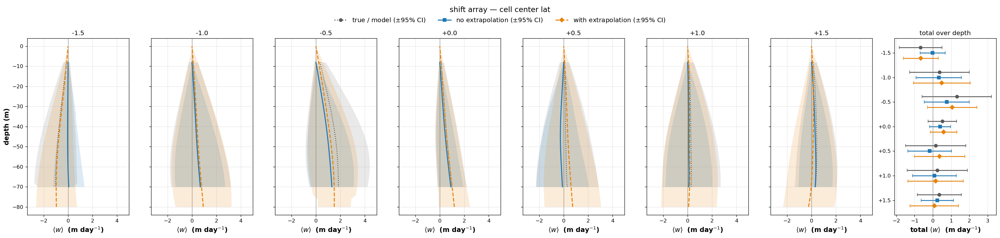

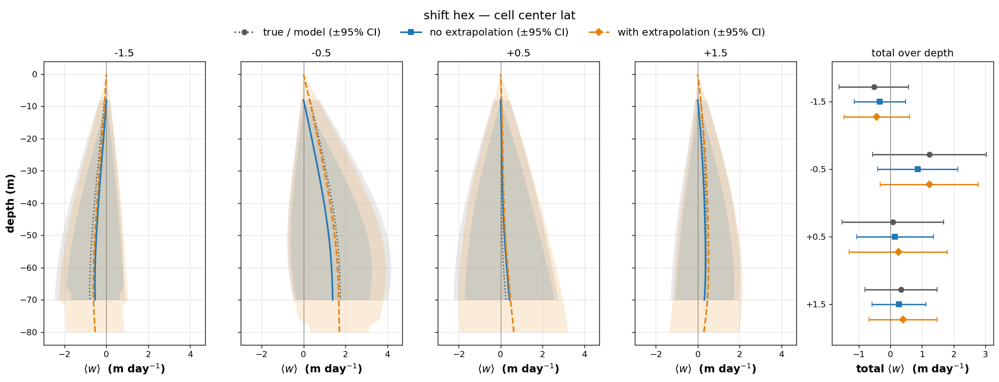

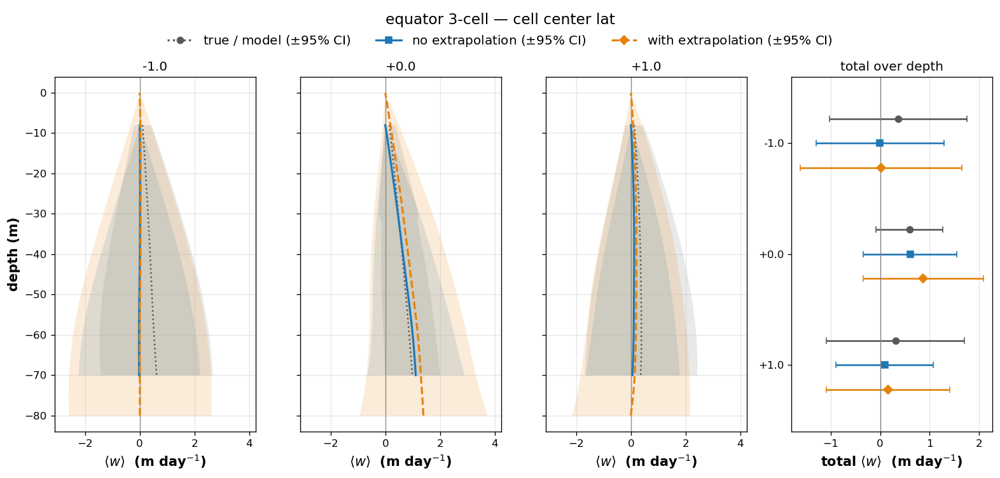

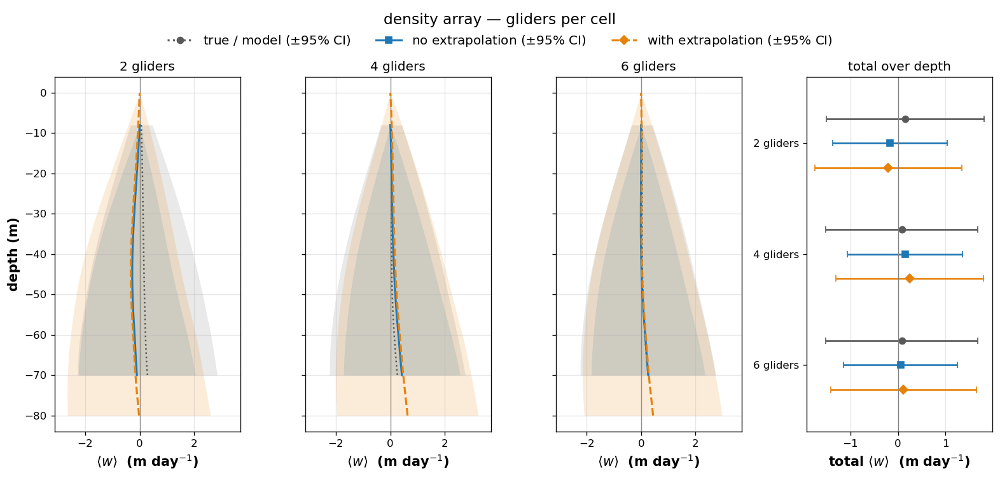

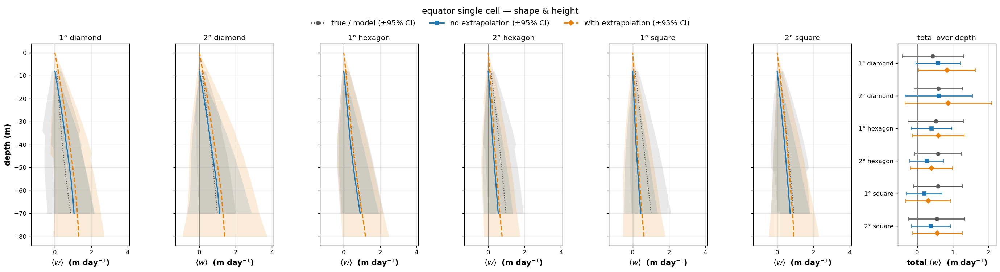

In [7]:
sft.make_fig7_compare(M, OUTDIR, load_cell)

## Figures 8a-8e - time-mean vertical velocity vs array width (exp1 vs exp2)

The same content as figures 7a-7e (estimated \<w\> +/- 95% CI for exp1 vs exp2
against the shared model truth), but with **one row per glider lon offset**
(0.5, 1.0, 1.5, 2.0 deg) instead of a single fixed width. Columns are the configs
of the method group plus the total-over-depth forest panel; the rows show how the
recovery and its CI change as the array widens.

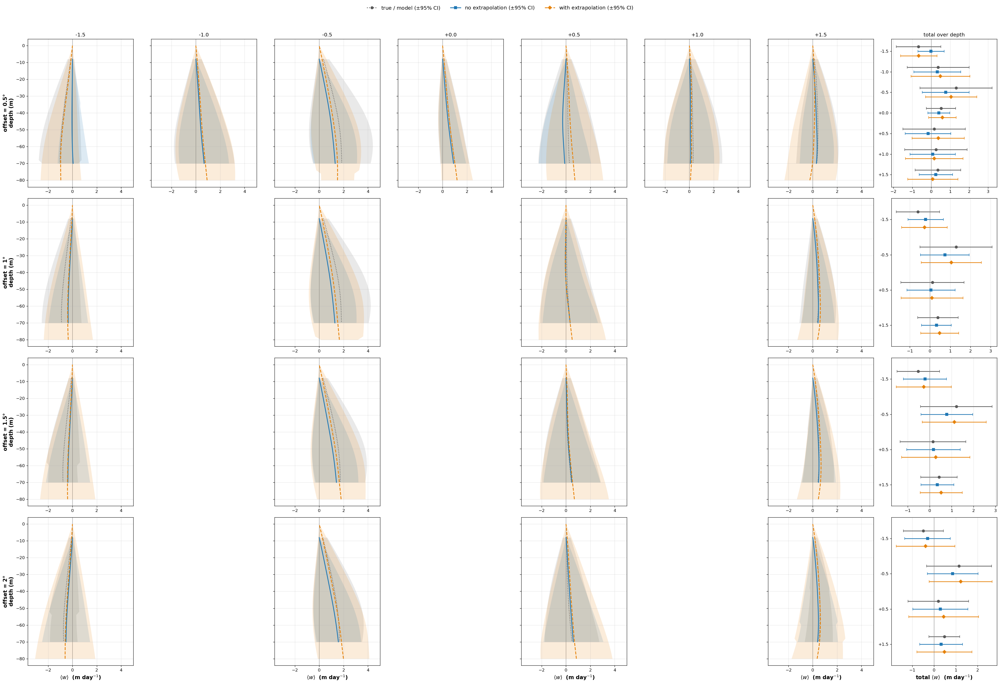

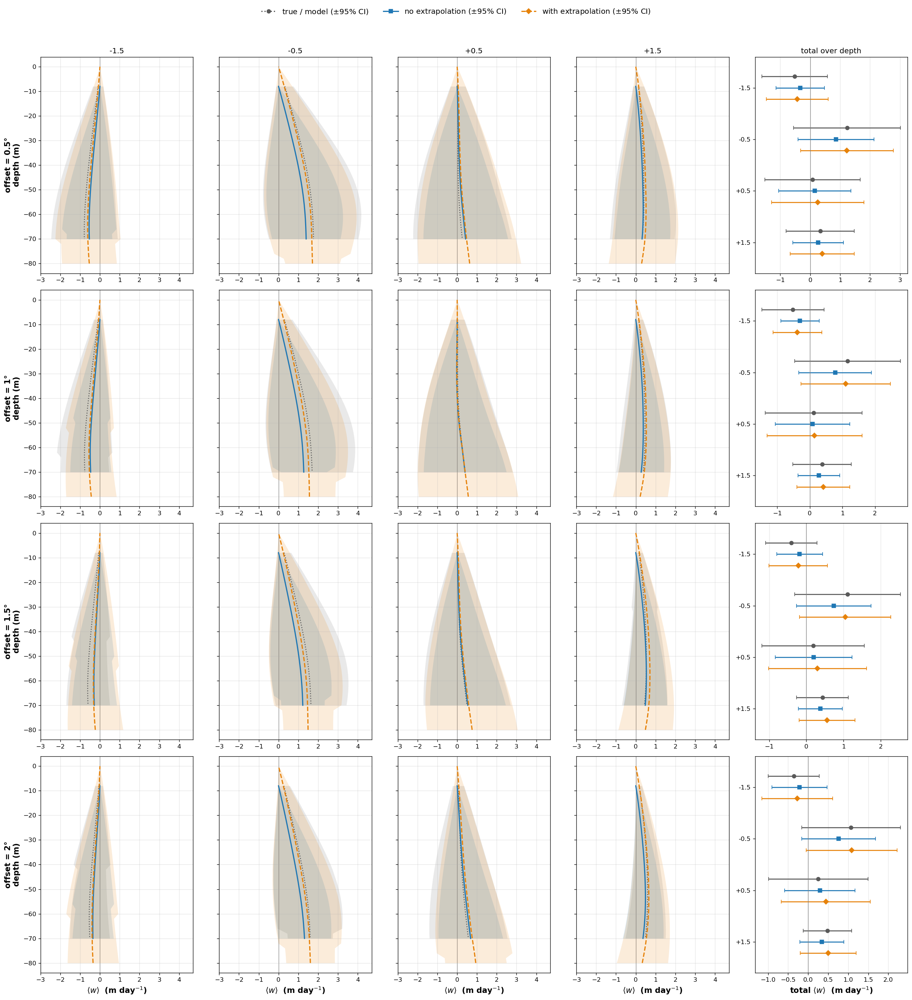

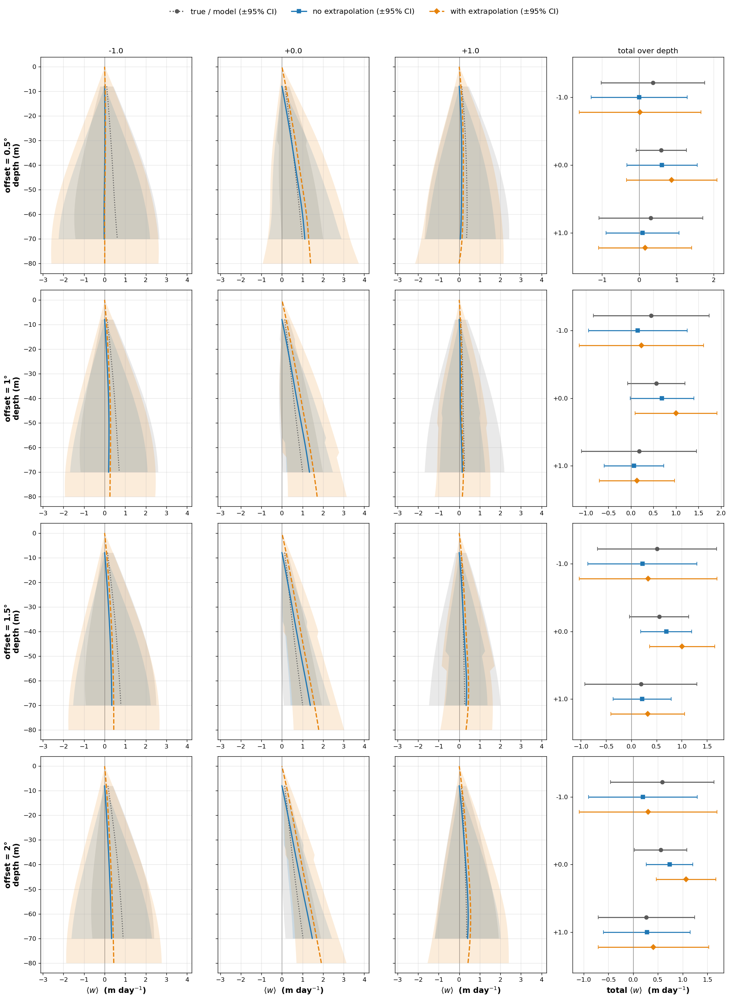

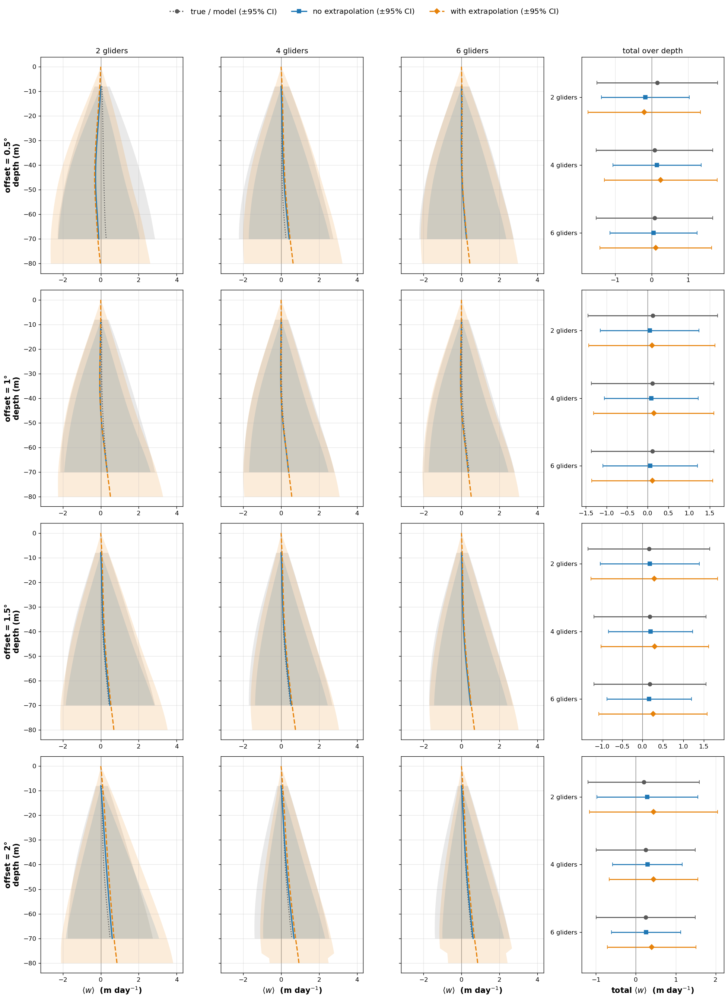

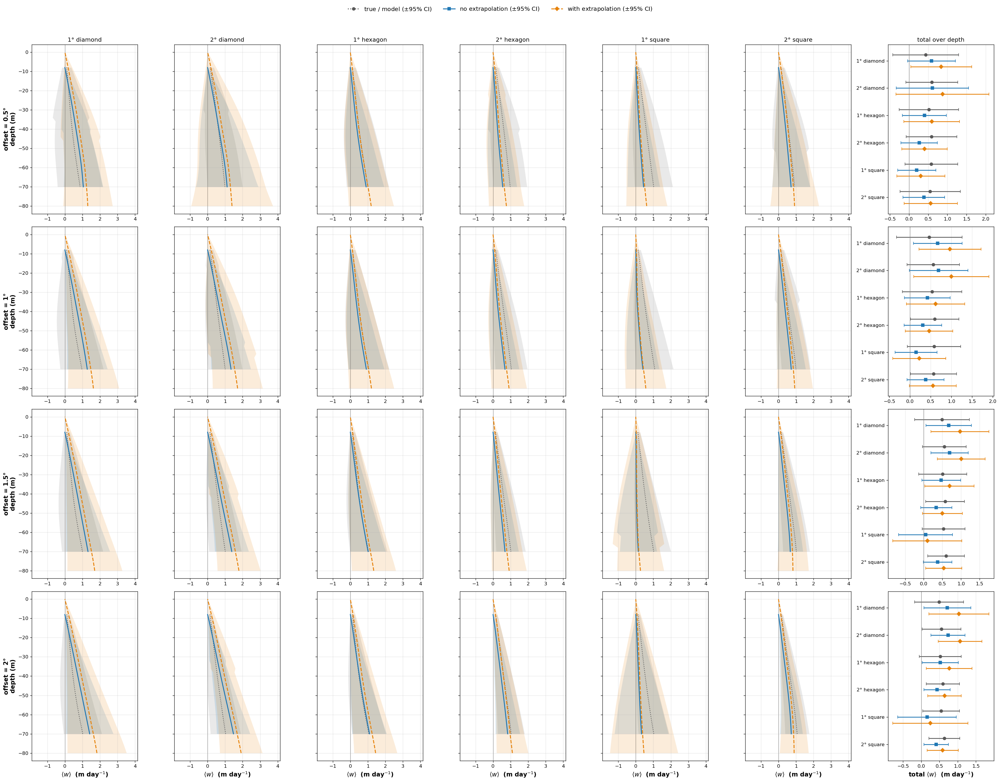

In [8]:
sft.make_fig8_compare(M, OUTDIR, load_cell)

## Symmetric regular-shape sweep — exp1 vs exp2 → sym_sweep/

The `symhex`/`symdia`/`symsq` sweep from each experiment overlaid, so the effect of
the surface-w treatment is visible for the regular-shape footprints. Same encoding as
above — **solid line / filled marker = no extrapolation, dashed line / open marker =
with extrapolation** — with **no new marker shape** (marker shape stays reserved for the
shape family: hexagon `h`, diamond `D`, square `s`; heat-flux panels use a plain `o`).
Colour is the within-figure knob (centre latitude, or shape). Figures → `sym_sweep/`.

Because experiment_1 samples a shallower column (8–70 m) than experiment_2 (0–80 m), every
comparison is made at the **deepest observed depth shared by both experiments (~70 m)** — not
over each experiment's own column — so neither experiment's extra depths bias the contrast.

**W-skill** (from `data/`, recomputed at the shared depth by `sym_deepest_shared_metrics`):
per family, six-panel skill vs E-W diameter, one colour per centre latitude
(`fig_<fam>_skill_vs_diameter_compare.png`); per centre, the shape comparison
(`fig_sym_shape_skill_vs_diameter_c<lat>_compare.png`); and the est-vs-true ⟨w⟩ scatter at
the shared depth (`fig_sym_w_scatter_deepest_compare.png`, filled = no extrap / open = with).

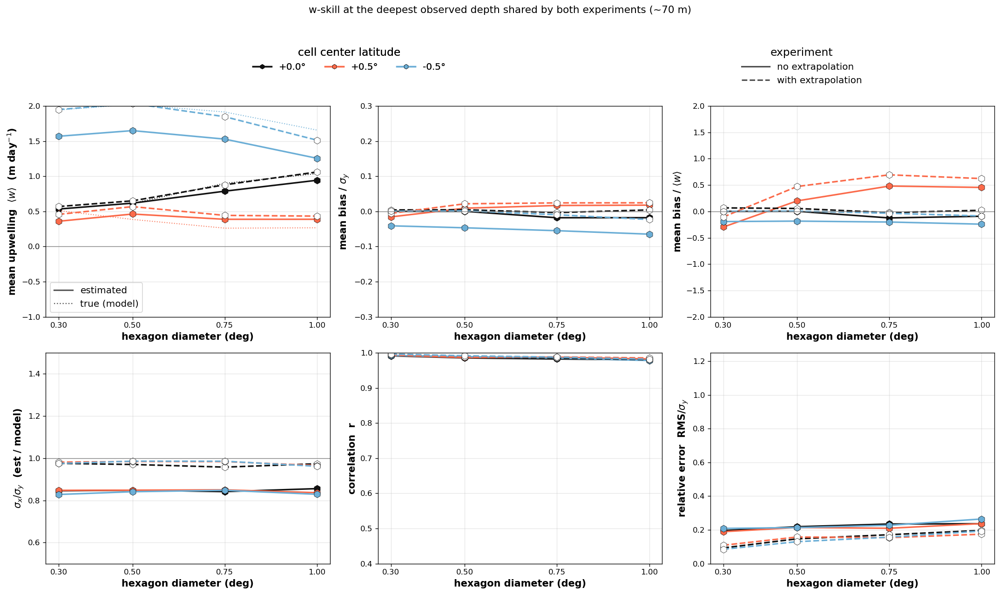

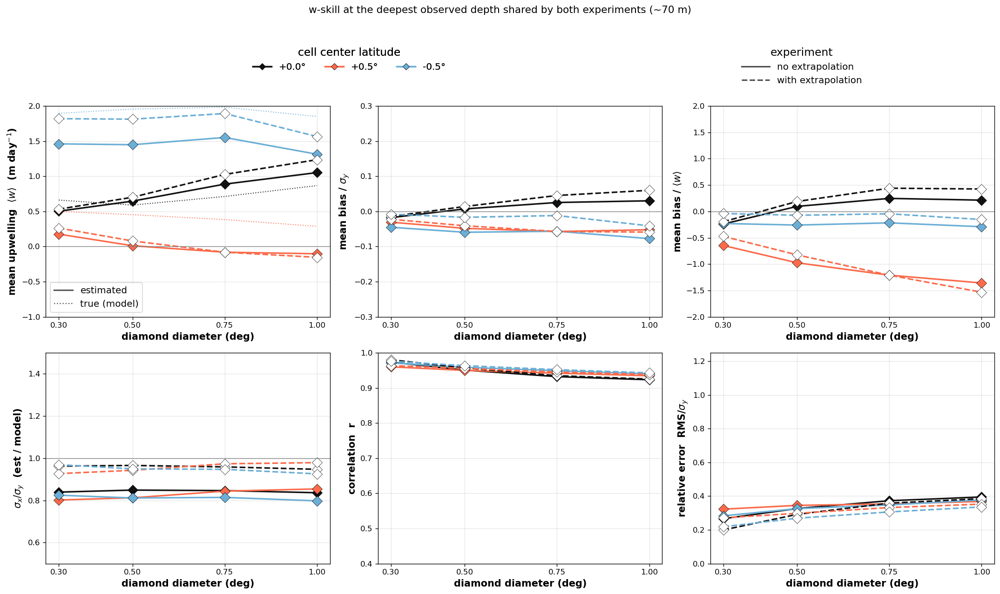

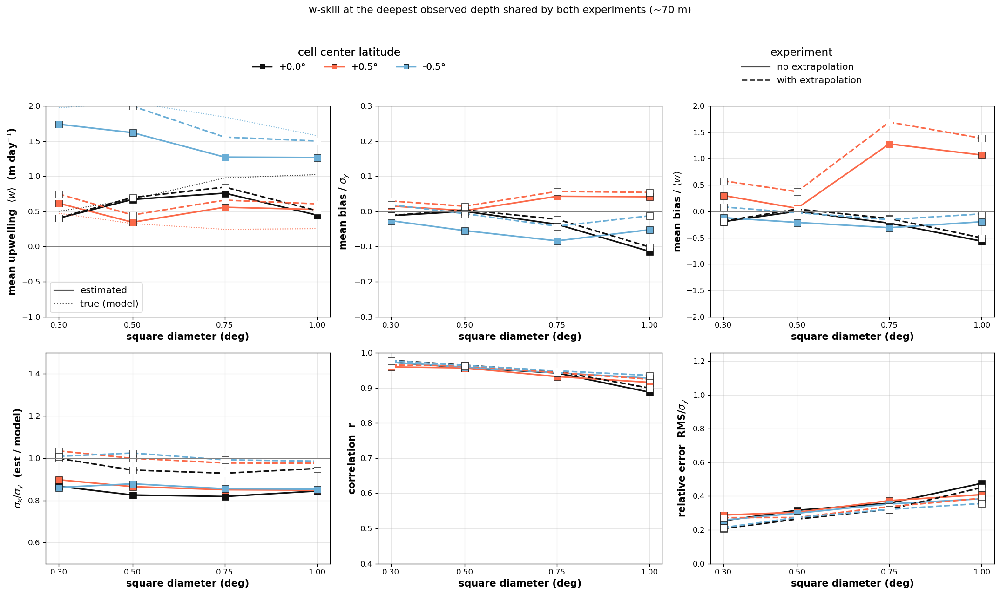

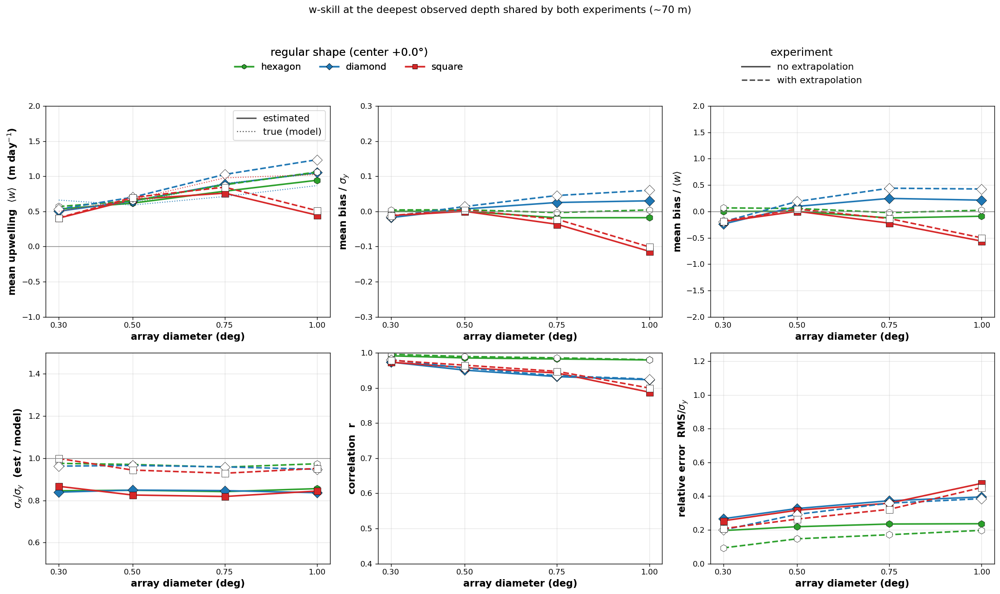

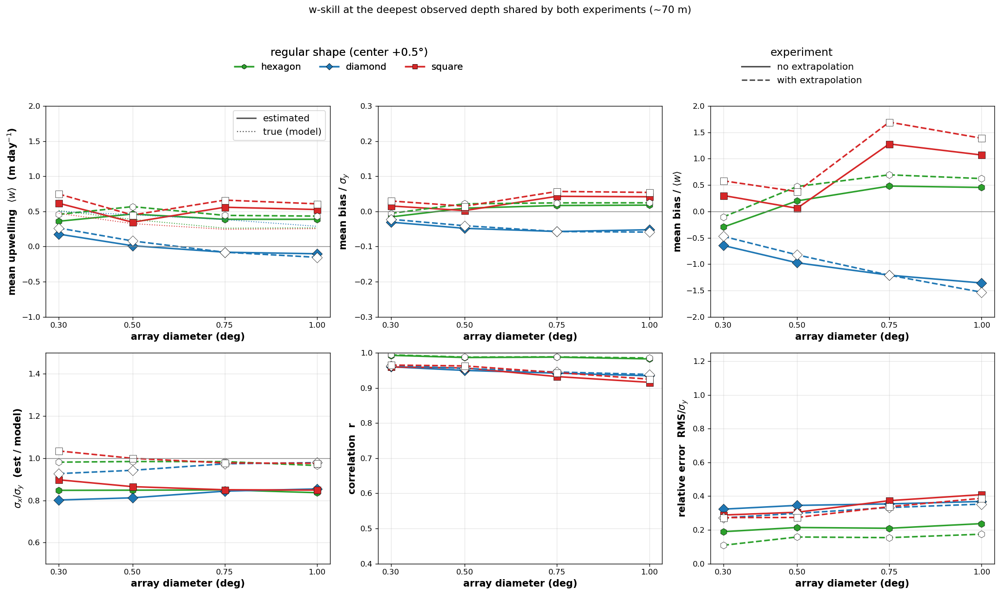

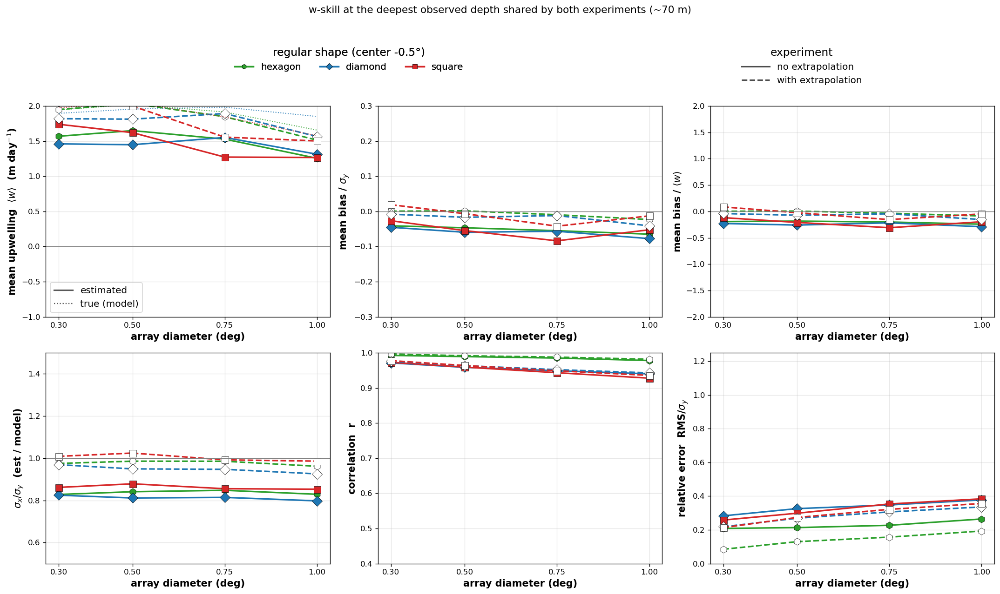

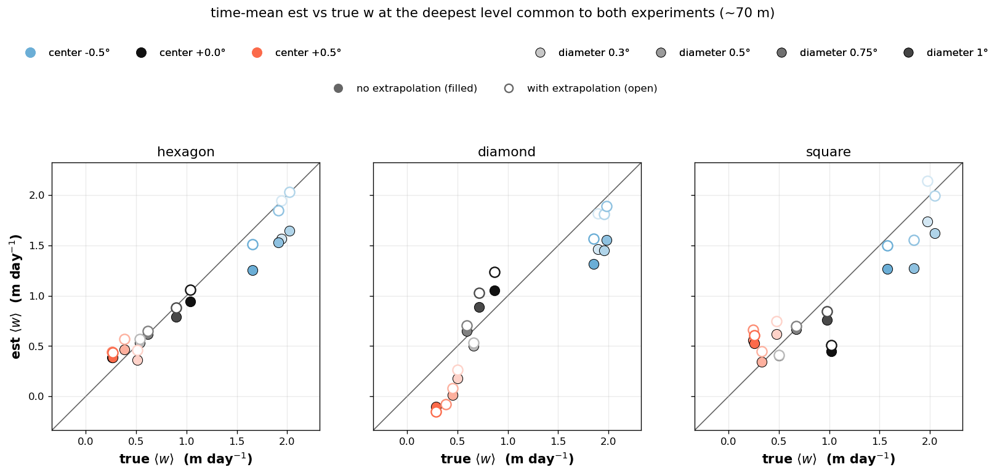

'/home/edavenport/analysis/tpose24-osse/experiments/compare_exp_1_2/sym_sweep/fig_sym_w_scatter_deepest_compare.png'

In [9]:
# --- sym_sweep W-skill comparison (exp1 vs exp2) -> compare_exp_1_2/sym_sweep/ ---
# Compared at the deepest observed depth SHARED by both experiments (exp1 samples 8-70 m,
# exp2 0-80 m), so neither experiment's extra depths bias the comparison.
SYMDIR = os.path.join(OUTDIR, "sym_sweep"); os.makedirs(SYMDIR, exist_ok=True)
DATA = {e: os.path.join(EXP_ROOT[e], "data") for e in (1, 2)}
Mc, zsh = sft.sym_deepest_shared_metrics(M, DATA)   # w-skill recomputed at deepest shared depth
for fam in sft.SYM_FAMILIES:                          # symhex, symdia, symsq
    sft.make_sym_summary_compare(Mc, SYMDIR, family=fam, zshared=zsh)   # skill vs diameter
for c in sft.SYMHEX_CENTERS:                          # shape comparison at each centre
    sft.make_sym_shape_summary_compare(Mc, SYMDIR, center=c, zshared=zsh)
sft.make_sym_w_scatter_deepest_compare(DATA, SYMDIR)  # deepest shared level, filled/open

### Heat-flux sym_sweep — exp1 vs exp2

The advective-heating error from each experiment's `data_heat/`, overlaid, evaluated at the
**deepest observed depth shared by both experiments (~70 m)**. Per family, the area-average
heating-error terms (total / estimate / sub-array) vs E-W diameter, one colour per centre
latitude (`error_scaling_<fam>_compare.png`); per centre, the same terms with one colour per
shape (`shape_compare_error_scaling_c<lat>_compare.png`). Top row = the heating-rate error at
the shared depth (°C day⁻¹); bottom row = the heat-flux error integrated down to that depth
(W m⁻²). no extrapolation = solid/filled, with extrapolation = dashed/open. The **sub-array**
term is a property of the truth field alone, so it is essentially identical across experiments;
the surface-w choice moves the **estimate** term, where the solid/dashed gap concentrates.

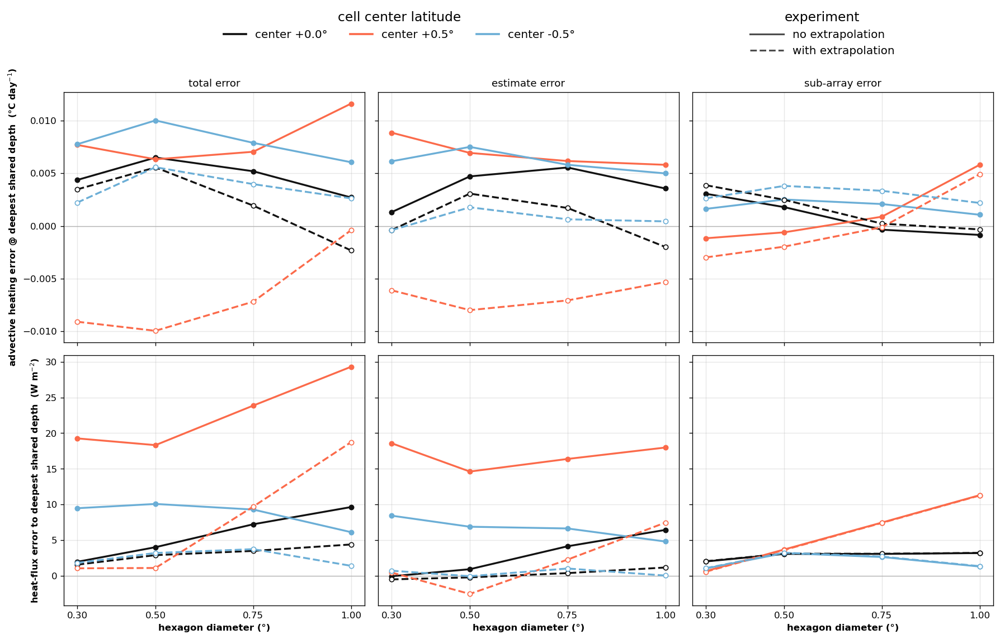

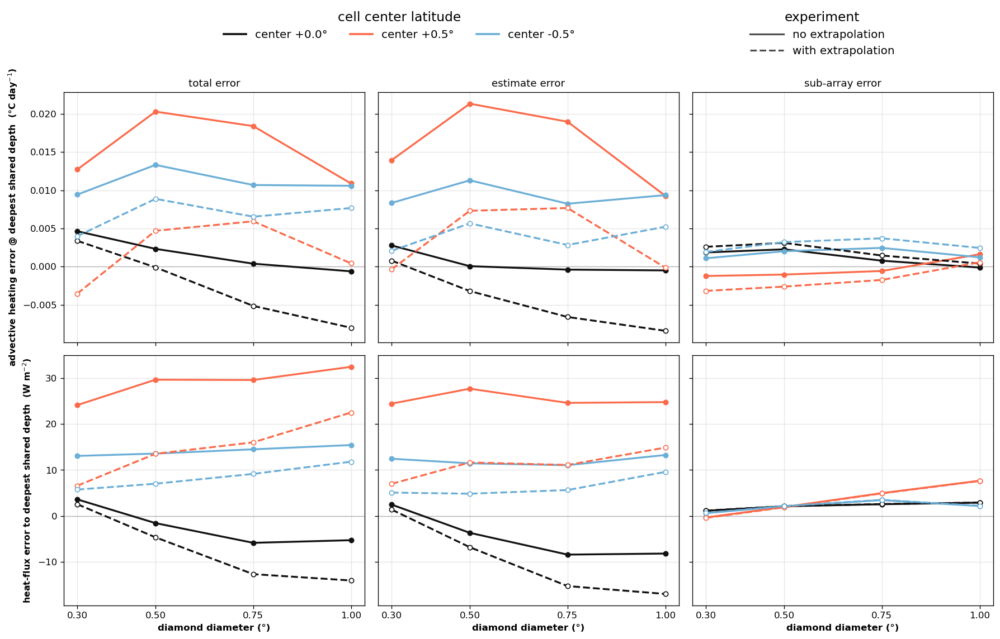

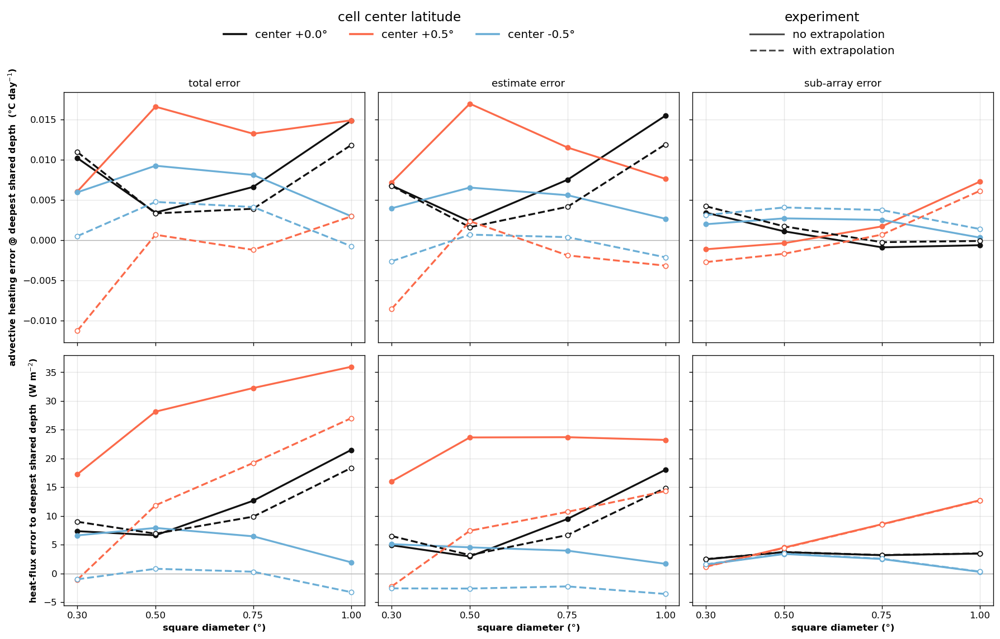

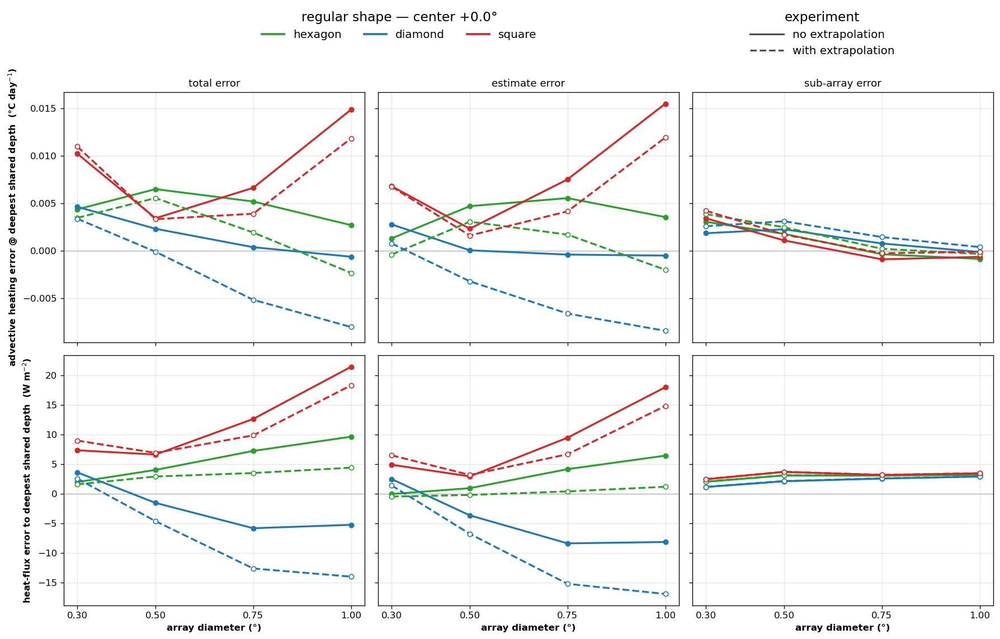

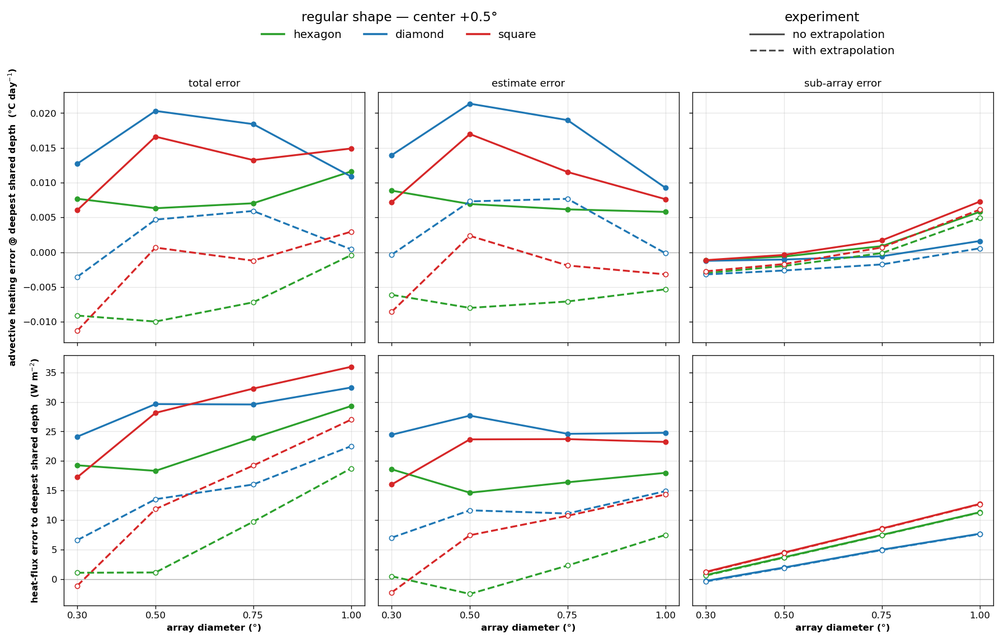

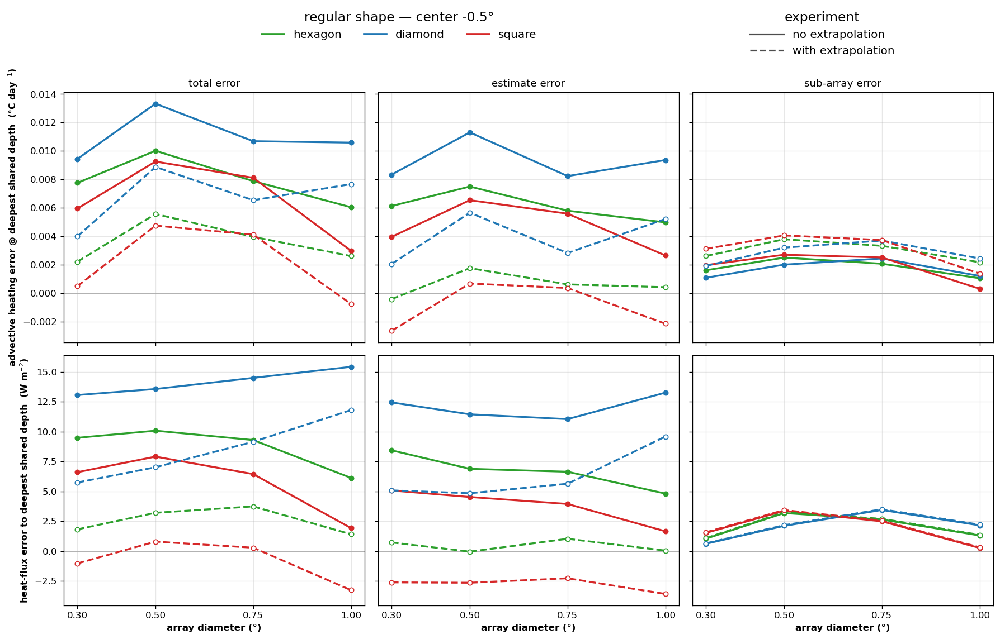

In [10]:
# --- sym_sweep heat-flux comparison (exp1 vs exp2) -> compare_exp_1_2/sym_sweep/ ---
import heat_flux_fig_tools as hft
hft.apply_style()
DATA_HEAT = {e: os.path.join(EXP_ROOT[e], "data_heat") for e in (1, 2)}

def savesym(fig, name):
    fig.savefig(os.path.join(SYMDIR, name), bbox_inches="tight", dpi=150)
    return fig

for fam in hft.SYM_FAMILIES:                              # symhex, symdia, symsq
    savesym(hft.make_error_scaling_symhex_compare(DATA_HEAT, family=fam),
            f"error_scaling_{fam}_compare.png")
for c in hft.SYMHEX_CENTERS:                              # shape comparison at each centre
    savesym(hft.make_error_scaling_sym_shapes_compare(DATA_HEAT, center=c),
            f"shape_compare_error_scaling_c{c:+.1f}_compare.png")